# Create train, test and val set for aKDGs

a) train and val set consisting of aKGDs inferred by Uniprot and similarity. Active ones identified by experimental evidence and for each 10 negatives inferred from tversky similarity 0.4

b) test_set is representing CH-pred experimental subset



In [16]:
 # the csv files can be found under /workspace/ProSmith/data/training_data/ESP/AKGDs_data
import os
import pandas as pd

test_data =  pd.read_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_test_df.csv') #containing experimental aKGD data from CH-Predict

train_val_data =  pd.read_csv('/workspace/ProSmith/data/training_data/ESP/AKGDs_data/prosmith_input_decoy_negatives_AKGDs.csv') #containing data from uniprot with decoy negatives


In [17]:
print(len(test_data), 'legnth of test data')
print(len(train_val_data), 'legnth of train_val data')

870 legnth of test data
38102 legnth of train_val data


# lets anaylze the test_data first

In [18]:
#lets anaylze the test_data first
test_data.head()
print(len(test_data['Protein sequence'].unique()), 'unique sequences in test data')
print(len(test_data['SMILES'].unique()), 'unique smiles in test data')

print(len(test_data['Protein sequence']), 'total sequences in test data')
print('Expected combinations:', len(test_data['Protein sequence'].unique())*len(test_data['SMILES'].unique()))

87 unique sequences in test data
10 unique smiles in test data
870 total sequences in test data
Expected combinations: 870


In [19]:
#check if output is the same for KGD102 and KGD032, KGD116 and KGD015 and KGD106 and KGD051

KGD102 = test_data[test_data['Uniprot ID'] == 'KGD102']
KGD032 = test_data[test_data['Uniprot ID'] == 'KGD032']
KGD116 = test_data[test_data['Uniprot ID'] == 'KGD116']
KGD015 = test_data[test_data['Uniprot ID'] == 'KGD015']
KGD106 = test_data[test_data['Uniprot ID'] == 'KGD106']
KGD051 = test_data[test_data['Uniprot ID'] == 'KGD051']


In [20]:
#make pairwise comparison and check if the output is the same
print('KGD102 and KGD032', KGD102['output'].equals(KGD032['output']))

#show differences in output for KGD102 and KGD032 based on SMILES and Protein sequence using merge
KGD102_KGD032 = pd.merge(KGD102, KGD032, on=['SMILES', 'Protein sequence', 'output'], how='outer', indicator=True)
KGD102_KGD032[KGD102_KGD032['_merge'] != 'both']


KGD102 and KGD032 False


,Uniprot ID_x,molecule ID_x,Uniprot ID_y,molecule ID_y,output,Protein sequence,SMILES,_merge
0,NaN,NaN,KGD032,CPD-023,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,OC([C@H](NC1)C[C@@H]1F)=O,right_only
1,NaN,NaN,KGD032,CPD-025,0,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,OC(C1CCCCCN1)=O,right_only
2,NaN,NaN,KGD032,CPD-022,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,OC([C@H](NC1)C[C@H]1F)=O,right_only
3,NaN,NaN,KGD032,CPD-030,0,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,O=C1NC[C@H]2[C@@H]1CCNC2.Cl,right_only
4,NaN,NaN,KGD032,CPD-027,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,CN(CC1)CCC21CNCC2,right_only
5,NaN,NaN,KGD032,CPD-019,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,OC([C@H]1CCN1)=O,right_only
6,NaN,NaN,KGD032,CPD-026,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,C1NCC2(CNCC2)C1.Cl.Cl,right_only
7,NaN,NaN,KGD032,CPD-028,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,CN1CC2C(CNC2)C1.Cl.Cl,right_only
8,NaN,NaN,KGD032,CPD-016,0,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,O=C(O)[C@@H]1NC2CCC1CC2,right_only
9,NaN,NaN,KGD032,CPD-018,1,MTNVTGDYTDCTPLLGDRAALDSFYEEHGYLFLRNVLDRDLVKTVA...,OC([C@@H]1CCN1)=O,right_only


In [21]:
#and now for the other pairs
print('KGD116 and KGD015', KGD116['output'].equals(KGD015['output']))

KGD116_KGD015 = pd.merge(KGD116, KGD015, on=['SMILES', 'Protein sequence', 'output'], how='outer', indicator=True)
KGD116_KGD015[KGD116_KGD015['_merge'] != 'both']


KGD116 and KGD015 False


,Uniprot ID_x,molecule ID_x,Uniprot ID_y,molecule ID_y,output,Protein sequence,SMILES,_merge
0,NaN,NaN,KGD015,CPD-023,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,OC([C@H](NC1)C[C@@H]1F)=O,right_only
1,NaN,NaN,KGD015,CPD-025,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,OC(C1CCCCCN1)=O,right_only
2,NaN,NaN,KGD015,CPD-022,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,OC([C@H](NC1)C[C@H]1F)=O,right_only
3,NaN,NaN,KGD015,CPD-030,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,O=C1NC[C@H]2[C@@H]1CCNC2.Cl,right_only
4,NaN,NaN,KGD015,CPD-027,1,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,CN(CC1)CCC21CNCC2,right_only
5,NaN,NaN,KGD015,CPD-019,1,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,OC([C@H]1CCN1)=O,right_only
6,NaN,NaN,KGD015,CPD-026,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,C1NCC2(CNCC2)C1.Cl.Cl,right_only
7,NaN,NaN,KGD015,CPD-028,1,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,CN1CC2C(CNC2)C1.Cl.Cl,right_only
8,NaN,NaN,KGD015,CPD-016,0,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,O=C(O)[C@@H]1NC2CCC1CC2,right_only
9,NaN,NaN,KGD015,CPD-018,1,MWYHRLSHLHSRLQDLLKGGVIYPALPQPNFKSLLPLAVHWHHTAS...,OC([C@@H]1CCN1)=O,right_only


In [22]:
#and now for the other pairs
print('KGD106 and KGD051', KGD106['output'].equals(KGD051['output']))

KGD106_KGD051 = pd.merge(KGD106, KGD051, on=['SMILES', 'Protein sequence', 'output'], how='outer', indicator=True)
KGD106_KGD051[KGD106_KGD051['_merge'] != 'both']



KGD106 and KGD051 False


,Uniprot ID_x,molecule ID_x,Uniprot ID_y,molecule ID_y,output,Protein sequence,SMILES,_merge
0,NaN,NaN,KGD051,CPD-023,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,OC([C@H](NC1)C[C@@H]1F)=O,right_only
1,NaN,NaN,KGD051,CPD-025,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,OC(C1CCCCCN1)=O,right_only
2,NaN,NaN,KGD051,CPD-022,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,OC([C@H](NC1)C[C@H]1F)=O,right_only
3,NaN,NaN,KGD051,CPD-030,1,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,O=C1NC[C@H]2[C@@H]1CCNC2.Cl,right_only
4,NaN,NaN,KGD051,CPD-027,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,CN(CC1)CCC21CNCC2,right_only
5,NaN,NaN,KGD051,CPD-019,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,OC([C@H]1CCN1)=O,right_only
6,NaN,NaN,KGD051,CPD-026,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,C1NCC2(CNCC2)C1.Cl.Cl,right_only
7,NaN,NaN,KGD051,CPD-028,1,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,CN1CC2C(CNC2)C1.Cl.Cl,right_only
8,NaN,NaN,KGD051,CPD-016,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,O=C(O)[C@@H]1NC2CCC1CC2,right_only
9,NaN,NaN,KGD051,CPD-018,0,MTVTINKSSVPHKVDFATPLSDVICHIKEDGAVIVRGFMDVETIQK...,OC([C@@H]1CCN1)=O,right_only


In [23]:
#get duplicated sequences in test data and remove it
duplicated_sequences = test_data[test_data.duplicated(['Protein sequence', 'SMILES'], keep=False)]
print(len(duplicated_sequences), 'duplicated sequences in test data')
#print Uniprot ID of duplicated sequences
print(duplicated_sequences['Uniprot ID'].unique())

0 duplicated sequences in test data
[]


In [24]:
#we remove the last duplicated sequence and keep the first one
test_data = test_data.drop_duplicates(['Protein sequence', 'SMILES'], keep='first')
#save the test data
test_data.to_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_test_df_wo_duplicates.csv', index=False)

# Let's analyze the train_val_data and remove duplicates

In [25]:
#lets anaylze the train_val_data 
train_val_data.head()
print(len(train_val_data['Protein sequence'].unique()), 'unique sequences in test data')
print(len(train_val_data['SMILES'].unique()), 'unique smiles in test data')

print(len(train_val_data['Protein sequence']), 'total sequences in test data')

1817 unique sequences in test data
1511 unique smiles in test data
38102 total sequences in test data


In [26]:
duplicated_sequences = train_val_data[train_val_data.duplicated(['Protein sequence', 'SMILES'], keep=False)]
print(len(duplicated_sequences), 'duplicated sequences in test data')
#print Uniprot ID of duplicated sequences
print(duplicated_sequences['Uniprot ID'].unique())

3485 duplicated sequences in test data
['A0A061L549' 'A0A090H1G1' 'A0A0B5K701' 'A0A0D6IJC4' 'A0A0E0XX57'
 'A0A0E1M0B4' 'A0A0E1SZ61' 'A0A0F6B5J0' 'A0A0H1AD67' 'A0A0I3ZH53'
 'A0A0J6YKV1' 'A0A0J8U729' 'A0A0K0HDK3' 'A0A0M0PWU1' 'A0A0M0QLU4'
 'A0A0M9J5H4' 'A0A0P7C1U4' 'A0A0P7CPN3' 'A0A0R9NIG2' 'A0A0T9X541'
 'A0A0V8T2V2' 'A0A136QEA4' 'A0A140N6S1' 'A0A152UXQ1' 'A0A165PL13'
 'A0A173HEI7' 'A0A192CBI9' 'A0A1A5CZV8' 'A0A1A8LX49' 'A0A1A8PR21'
 'A0A1B8NY02' 'A0A1F1QIY9' 'A0A1I7DPU3' 'A0A1S0ZP07' 'A0A1S9JPW6'
 'A0A1W2F714' 'A0A1X0QN77' 'A0A1X8W5B1' 'A0A285Z0R6' 'A0A2D1TL00'
 'A0A2G4SUF4' 'A0A2I0CGU4' 'A0A2I2ZHW0' 'A0A2I3T9E2' 'A0A2J8P4G6'
 'A0A2K5HG58' 'A0A2K5L2K6' 'A0A2K5SAM5' 'A0A2K5TW47' 'A0A2K5VJL2'
 'A0A2K6AFV6' 'A0A2K6BD24' 'A0A2K6C6A1' 'A0A2K6K876' 'A0A2L0SZD9'
 'A0A2L1IL12' 'A0A2N5BS54' 'A0A2N8F251' 'A0A2P7ZA64' 'A0A2R9B1D4'
 'A0A2R9B329' 'A0A2S3WK65' 'A0A2S8DVT3' 'A0A2T8MLB8' 'A0A2T9Q6G8'
 'A0A2V2VEG2' 'A0A2W0EVI2' 'A0A2Y9MLY3' 'A0A315G6Q3' 'A0A341D0G8'
 'A0A341D1V9' 'A0A3A3N2L0' 'A0A3B7RDV

In [27]:
#lets just remove the duplicated sequences
train_val_data = train_val_data.drop_duplicates(['Protein sequence', 'SMILES'], keep='first')
#save the train_val data
train_val_data.to_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/prosmith_input_decoy_negatives_AKGDs_wo_duplicates.csv', index=False)

In [28]:
# furthermore we can analyse the train_val_data using mmseqs2¨
# get dataframe with unique sequences
unique_sequences = train_val_data.drop_duplicates(['Protein sequence'], keep='first')

with open('train_val_data.fasta', 'w') as f:
    for index, row in unique_sequences.iterrows():
        f.write('>' + row['Uniprot ID'] + '\n' + row['Protein sequence'] + '\n')


In [29]:
#using mmseqs2 to cluster the sequences
import subprocess

#mmseqs easy-cluster test_data.fasta clusterRes tmp --min-seq-id 0.5 -c 0.8 --cov-mode 1

subprocess.run(['mmseqs', 'easy-cluster', 'test_data.fasta', 'clusterRes', 'tmp', '--min-seq-id', '0.9', '-c', '0.8', '--cov-mode', '1'])


easy-cluster test_data.fasta clusterRes tmp --min-seq-id 0.9 -c 0.8 --cov-mode 1 

MMseqs Version:                     	15.6f452
Substitution matrix                 	aa:blosum62.out,nucl:nucleotide.out
Seed substitution matrix            	aa:VTML80.out,nucl:nucleotide.out
Sensitivity                         	4
k-mer length                        	0
Target search mode                  	0
k-score                             	seq:2147483647,prof:2147483647
Alphabet size                       	aa:21,nucl:5
Max sequence length                 	65535
Max results per query               	20
Split database                      	0
Split mode                          	2
Split memory limit                  	0
Coverage threshold                  	0.8
Coverage mode                       	1
Compositional bias                  	1
Compositional bias                  	1
Diagonal scoring                    	true
Exact k-mer matching                	0
Mask residues                       	1
Mask residues 

==] 1.09K 0s 80ms
Time for merging to aln: 0h 0m 0s 11ms
3874 alignments calculated
1247 sequence pairs passed the thresholds (0.321890 of overall calculated)
1.148250 hits per query sequence
Time for processing: 0h 0m 0s 230ms
clust tmp/5211884431100415039/clu_tmp/16060087877131390446/linclust/11441841964251558235/input_step_redundancy tmp/5211884431100415039/clu_tmp/16060087877131390446/linclust/11441841964251558235/aln tmp/5211884431100415039/clu_tmp/16060087877131390446/linclust/11441841964251558235/clust --cluster-mode 3 --max-iterations 1000 --similarity-type 2 --threads 64 --compressed 0 -v 3 --cluster-weight-threshold 0.9 

Clustering mode: Greedy Low Mem
Total time: 0h 0m 0s 17ms

Size of the sequence database: 1086
Size of the alignment database: 1086
Number of clusters: 968

Writing results 0h 0m 0s 0ms
Time for merging to clust: 0h 0m 0s 0ms
Time for processing: 0h 0m 0s 23ms
mergeclusters tmp/5211884431100415039/input tmp/5211884431100415039/clu_tmp/16060087877131390446/cl

CompletedProcess(args=['mmseqs', 'easy-cluster', 'test_data.fasta', 'clusterRes', 'tmp', '--min-seq-id', '0.9', '-c', '0.8', '--cov-mode', '1'], returncode=0)

In [30]:
#lets analyse the clusterRes file
clusterRes = pd.read_csv('clusterRes_cluster.tsv', sep='\t', header=None)
clusterRes.head()
'''All members of the clustering are listed line by line. 
Each cluster is a consecutive block in the file. The first column always contains the representative sequence, the second contains the cluster member. For the example the cluster with the representative sequence Q0KJ32 contains four members itself and C0W539, D6KVP9, D1Y890.
 IDs are parsed from the header from the input database (see id parsing from headers).
'''
#lets count the number of clusters and its memebers
print(len(clusterRes[0].unique()), 'number of clusters')

#lets count the number of sequences in each cluster
clusterRes[0].value_counts()


921 number of clusters


A0A8B9EIS0    96
A0A663ET45    49
A0A0P6IYN2    48
A0A673U186    46
A0A1X3I2I0    44
              ..
A0A2Z3JCC3     1
A0A2Z6S1L2     1
A0A316UPS7     1
A0A0J9X362     1
Q9SVS8         1
Name: 0, Length: 921, dtype: int64

In [31]:
clusterRes_small = clusterRes[1:10]

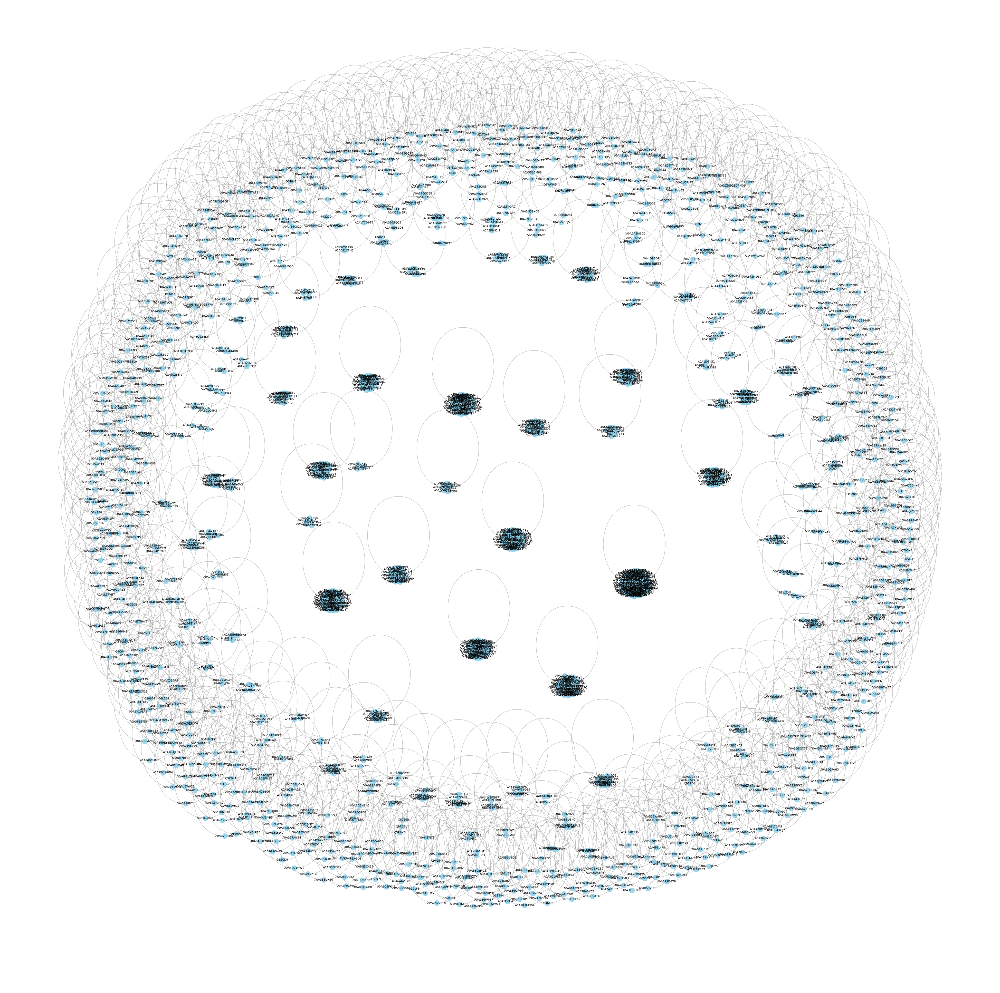

In [32]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Add edges from the DataFrame
for index, row in clusterRes.iterrows():
    G.add_edge(row[0], row[1])

# Set node positions using the spring layout
pos = nx.spring_layout(G)
# Set a clear background
plt.figure(figsize=(50, 50))
plt.gca().set_facecolor('white')

# Draw nodes with adjusted size and color
nx.draw_networkx_nodes(G, pos, node_size=200, node_color='skyblue', alpha=0.8)

# Draw edges with adjusted thickness and color
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5, edge_color='gray')

# Draw labels with adjusted font size
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')


# Show the plot
plt.axis('off')  # Turn off axis
plt.show()


In [33]:
#only keep one member for each cluster
one_member = clusterRes.drop_duplicates([0], keep='first')

#lets reduce the amount of data in the train_val_data base on that
train_val_data = train_val_data[train_val_data['Uniprot ID'].isin(one_member[0])]
print(len(train_val_data), 'legnth of train_val data after removing sequences that are in the same cluster')

18532 legnth of train_val data after removing sequences that are in the same cluster


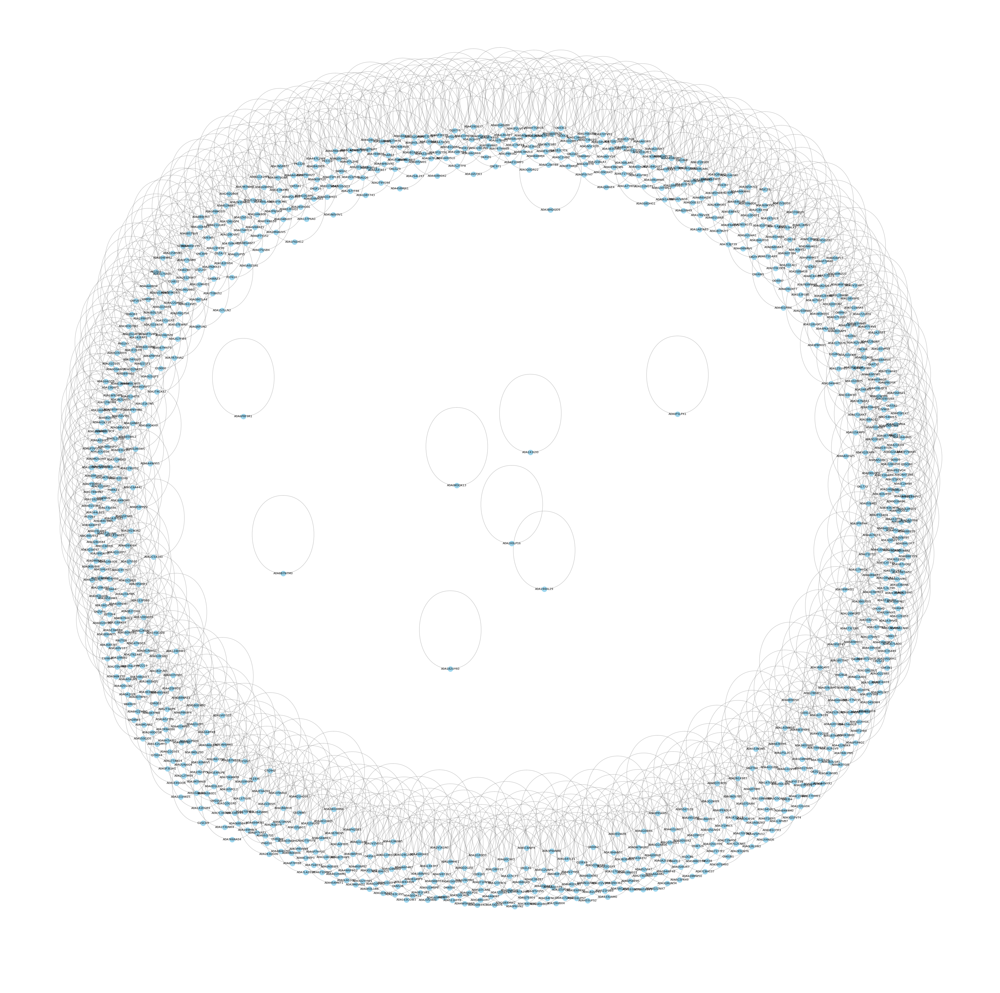

In [34]:
#plot one_member
# Create a graph
G = nx.Graph()

# Add edges from the DataFrame
for index, row in one_member.iterrows():
    G.add_edge(row[0], row[1])

# Set node positions using the spring layout
pos = nx.spring_layout(G)
# Set a clear background
plt.figure(figsize=(50, 50))
plt.gca().set_facecolor('white')

# Draw nodes with adjusted size and color
nx.draw_networkx_nodes(G, pos, node_size=200, node_color='skyblue', alpha=0.8)

# Draw edges with adjusted thickness and color
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5, edge_color='gray')

# Draw labels with adjusted font size
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')


# Show the plot
plt.axis('off')  # Turn off axis
plt.show()

In [35]:
#we need to construct train and val set from train_val_data using sklearn and 90/10 and then save them as csv files
from sklearn.model_selection import train_test_split

train_data, val_data = train_test_split(train_val_data, test_size=0.1, random_state=42)

print(len(train_data), 'legnth of train data')
print(len(val_data), 'legnth of val data')

#lets check if the ratio of active and inactive is the same in the train and val set
print('train data')
print(train_data['output'].value_counts())
print('val data')
print(val_data['output'].value_counts())
print('test data')
print(test_data['output'].value_counts()) #the test data contains only 0 as output as it is the data which is going to be predicted


16678 legnth of train data
1854 legnth of val data
train data
0    14865
1     1813
Name: output, dtype: int64
val data
0    1660
1     194
Name: output, dtype: int64
test data
0    706
1    164
Name: output, dtype: int64


In [36]:
#lets make another split using groupshufflesplit

from sklearn.model_selection import GroupShuffleSplit

def generate_grouped_splits(data, test_size=0.1, random_state=42):
    gss = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)

    for train_index, val_index in gss.split(data, groups=data['Protein sequence']):
        train_data = data.iloc[train_index]
        val_data = data.iloc[val_index]
        yield train_data, val_data

# Usage
for train_data, val_data in generate_grouped_splits(train_val_data):
    print(len(train_data), 'length of train data')
    print(len(val_data), 'length of val data')
    print('train data')
    print(train_data['output'].value_counts())
    print('val data')
    print(val_data['output'].value_counts())

16568 length of train data
1964 length of val data
train data
0    14787
1     1781
Name: output, dtype: int64
val data
0    1738
1     226
Name: output, dtype: int64


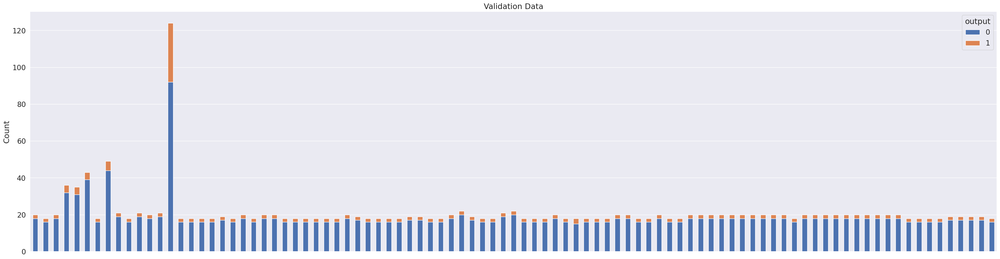

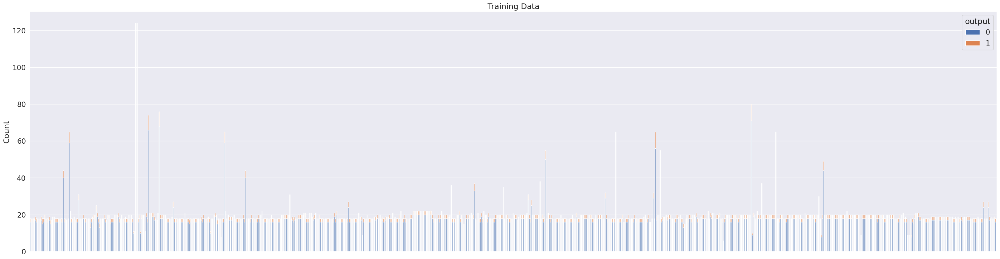

In [46]:
import matplotlib.pyplot as plt

def plot_protein_output(data, title):
    # Group by 'Protein sequence' and 'output', then unstack to create a DataFrame suitable for a stacked bar plot
    grouped = data.groupby(['Protein sequence', 'output']).size().unstack(fill_value=0)
    
    # Create the stacked bar plot
    #don't plot xlabels as there are too many

    grouped.plot(kind='bar', stacked=True, figsize=(40, 10), legend=True, xticks=[])
    
    plt.title(title)
    
    plt.xlabel('')
    plt.ylabel('Count')
    plt.show()


plot_protein_output(val_data, 'Validation Data')
plot_protein_output(train_data, 'Training Data')


In [ ]:
#that looks actually good, we have for each protein sequence the same ratio of active and inactive in the train and val set lets look if we have the same for the smiles

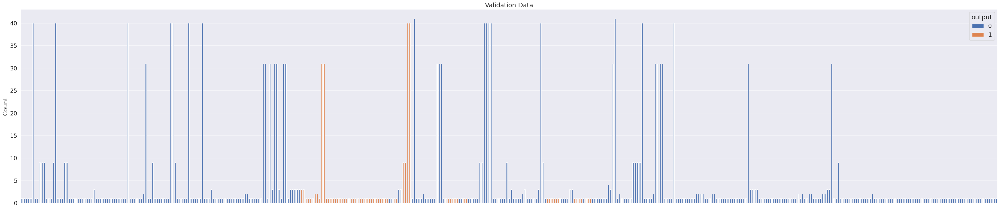

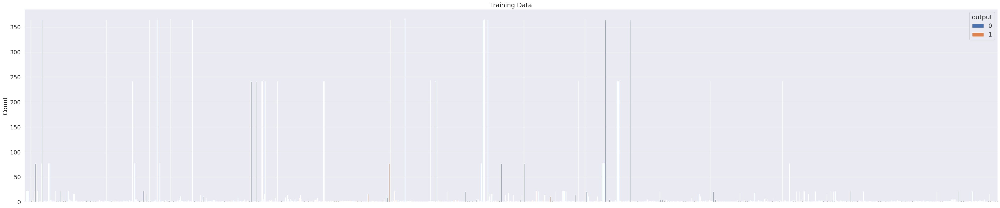

In [48]:
#in case of smiles we need to check if we have duplicates due to canonical and isomeric smiles but first lets just check the distribution
#plotting again the distribution of active and inactive in the train and val set but this time for smiles

def plot_smiles_output(data, title):
    # Group by 'Protein sequence' and 'output', then unstack to create a DataFrame suitable for a stacked bar plot
    grouped = data.groupby(['SMILES', 'output']).size().unstack(fill_value=0)
    
    # Create the stacked bar plot
    #don't plot xlabels as there are too many

    grouped.plot(kind='bar', stacked=True, figsize=(50, 10), legend=True, xticks=[])
    
    plt.title(title)
    
    plt.xlabel('')
    plt.ylabel('Count')
    plt.show()


plot_smiles_output(val_data, 'Validation Data')
plot_smiles_output(train_data, 'Training Data')

In [61]:
#that doeesnt look good. It seems that many smiles are either only active or inactive in the train and val set.
#lets group by smiles and count the number of active and inactive
train_data_smiles = train_data.groupby(['SMILES', 'output']).size().unstack(fill_value=0)
val_data_smiles = val_data.groupby(['SMILES', 'output']).size().unstack(fill_value=0)

#lets now count the number of active and inactive for each smiles
train_data_smiles['only_active_or_inactive'] = train_data_smiles.apply(lambda x: x[0] == 0 or x[1] == 0, axis=1)
print('only active or inactive',train_data_smiles['only_active_or_inactive'].value_counts())
print('total lenght of train data', len(train_data_smiles))


val_data_smiles['only_active_or_inactive'] = val_data_smiles.apply(lambda x: x[0] == 0 or x[1] == 0, axis=1)
print('only active or inactive',val_data_smiles['only_active_or_inactive'].value_counts())
print('total lenght of val data', len(val_data_smiles))

only active or inactive True    1433
Name: only_active_or_inactive, dtype: int64
total lenght of train data 1433
only active or inactive True    433
Name: only_active_or_inactive, dtype: int64
total lenght of val data 433


In [64]:
train_data_smiles

output,0,1,only_active_or_inactive
SMILES,,,
B([O-])([O-])[O-].[Na+].[Na+].[Na+],3,0,True
C(#CCCCCCCCCCCCC/C=C\CCCCCC)[C@H](C(=O)O)OS(=O)(=O)[O-].[Na+],1,0,True
C(/C=C\CCCCC(=O)O)/C=C\C=C\C=C\[C@H]([C@@H](O)CCCC(=O)O)SC[C@H](N)C(=O)O,1,0,True
C(/C=C\CCCCC(O)O)[C@H](CC/C=C/C=C\[C@H](CCCC(=O)O)O)O,22,0,True
C(/C=C\CCCCC)C(=O)CC/C=C/C=C\[C@H](CCCC(=O)O)O,22,0,True
...,...,...,...
n1c(nc(nc1O)Cl)N,1,0,True
n1c(nc2c(c1)nc[nH]2)N,2,0,True
n1c(nc2c(c1N)ncn2[C@@H]1O[C@H]2[C@H]([C@H]1O)OP(=O)(OC2)O)NCCCCCCN,2,0,True


In [66]:
#we need to generate decoy negatives for the smiles that are only active (we can't do that for the inactive ones)
#lets first get the smiles that are only active
train_data_smiles_only_active = train_data_smiles[train_data_smiles[0] == 0]
len(train_data_smiles_only_active)
#lets get the corresponding protein sequences
train_data_smiles_only_active = train_data[train_data['SMILES'].isin(train_data_smiles_only_active.index)]

In [67]:
train_data_smiles_only_active.head()

,Uniprot ID,molecule ID,output,Protein sequence,SMILES,both
20,A0A015KMP9,"N(6),N(6),N(6)-trimethyl-L-lysine",1,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C[N+](C)(C)CCCCC(N)C(=O)[O-],MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...
27,A0A015KMP9,"(3S)-3-hydroxy-N(6),N(6),N(6)-trimethyl-L-lysine",1,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C[N+](C)(C)CCCC(O)C(N)C(=O)[O-],MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...
38,A0A016TEZ4,4-(trimethylamino)butanoate,1,MFARFQARFITSAAKIASVSQPINRIITVEWTDGMKGKFPVIWLRD...,C[N+](C)(C)CCCC(=O)[O-],MFARFQARFITSAAKIASVSQPINRIITVEWTDGMKGKFPVIWLRD...
47,A0A016TEZ4,carnitine,1,MFARFQARFITSAAKIASVSQPINRIITVEWTDGMKGKFPVIWLRD...,C[N+](C)(C)CC(O)CC(=O)[O-],MFARFQARFITSAAKIASVSQPINRIITVEWTDGMKGKFPVIWLRD...
57,A0A017SRD1,"(3S)-3-hydroxy-N(6),N(6),N(6)-trimethyl-L-lysine",1,MSMPRLSSSRVLASPWKNASASFTPKHINLRVNSRGLSVVLRPSPP...,C[N+](C)(C)CCCC(O)C(N)C(=O)[O-],MSMPRLSSSRVLASPWKNASASFTPKHINLRVNSRGLSVVLRPSPP...


In [94]:
#we could find protein sequences that are as dismilar as possible for each protein sequence in train_data_smiles_only_active and add it as decoy negative
#lets try to do that using mmseqs2
#we need to construct a fasta file with the protein sequences
os.chdir('/workspace/ProSmith/')
with open('train_data_smiles_only_active.fasta', 'w') as f:
    for index, row in train_data_smiles_only_active.iterrows():
        f.write('>' + row['Uniprot ID'] + '\n' + row['Protein sequence'] + '\n')

#these are the query sequences and we can compare it with train_val_data.fasta

#first copy that into a new folder
os.mkdir('decoy_proteins')

subprocess.run(['cp', 'train_val_data.fasta', 'decoy_proteins'])
subprocess.run(['cp', 'train_data_smiles_only_active.fasta', 'decoy_proteins'])
os.chdir('decoy_proteins')

In [95]:
#we already did a clustering of the sequences in train_val_data.fasta and saved it as clusterRes_cluster.tsv
#we can use that to get the representative sequences for each cluster
#lets get the representative sequences and 
import subprocess

# Create a database from your fasta file
subprocess.run(["mmseqs", "createdb", "train_val_data.fasta", "train_val_data_DB"], check=True)

# Perform the all-vs-all sequence comparison
subprocess.run(["mmseqs", "search", "train_val_data_DB", "train_val_data_DB", "result_DB", "tmp", "--min-seq-id", "0.2"], check=True)

# Convert the results to a readable format
subprocess.run(["mmseqs", "convertalis", "train_val_data_DB", "train_val_data_DB", "result_DB", "result.m8"], check=True)

createdb train_val_data.fasta train_val_data_DB 

MMseqs Version:       	15.6f452
Database type         	0
Shuffle input database	true
Createdb mode         	0
Write lookup file     	1
Offset of numeric ids 	0
Compressed            	0
Verbosity             	3

Converting sequences
[
Time for merging to train_val_data_DB_h: 0h 0m 0s 2ms
Time for merging to train_val_data_DB: 0h 0m 0s 3ms
Database type: Aminoacid
Time for processing: 0h 0m 0s 21ms
Create directory tmp
search train_val_data_DB train_val_data_DB result_DB tmp --min-seq-id 0.2 

MMseqs Version:                        	15.6f452
Substitution matrix                    	aa:blosum62.out,nucl:nucleotide.out
Add backtrace                          	false
Alignment mode                         	2
Alignment mode                         	0
Allow wrapped scoring                  	false
E-value threshold                      	0.001
Seq. id. threshold                     	0.2
Min alignment length                   	0
Seq. id. mode       

CompletedProcess(args=['mmseqs', 'convertalis', 'train_val_data_DB', 'train_val_data_DB', 'result_DB', 'result.m8'], returncode=0)

In [96]:
#now get from result.m8 the uniprot id which has a sequence identity of 0.6 or less for each query sequence

result = pd.read_csv('result.m8', sep='\t', header=None)
result.head()


,0,1,2,3,4,5,6,7,8,9,10,11
0,A0A2X2LVP9,A0A2X2LVP9,1.000,297,0,0,1,297,1,297,6.357000e-202,616
1,A0A2X2LVP9,A0A7K3RFT4,0.977,297,7,0,1,297,1,297,4.213000e-201,614
2,A0A2X2LVP9,Q6QUY7,0.968,297,9,0,1,297,1,297,4.765000e-199,608
3,A0A2X2LVP9,A0A3R9WCN8,0.966,297,10,0,1,297,1,297,2.304000e-198,606
4,A0A2X2LVP9,A0A2S3Y2V2,0.963,297,11,0,1,297,1,297,8.129000e-198,604


In [175]:
#get all uniprot ids for each query sequence
query_seq = train_data_smiles_only_active['Uniprot ID']

print(len(query_seq), 'length of query sequences')
#column 0 is the query sequence and column 1 is the target sequence and column 2 is the sequence identity
#lets get all target sequnces for each query sequence which have a sequence identity of 0.3 or less together with the query sequence
query_and_target = result[result[2] <= 0.3]
print(len(query_and_target), 'length of query and target sequences with sequence identity of 0.3 or less')
#we can't do that or else we loose too much data
#lets try 0.6
query_and_target = result[result[2] <= 0.8]
print(len(query_and_target), 'length of query and target sequences with sequence identity of 0.8 or less')
query_and_target = result

1781 length of query sequences
2328 length of query and target sequences with sequence identity of 0.3 or less
354294 length of query and target sequences with sequence identity of 0.8 or less


In [176]:
#select for each query sequence the target sequence with the lowest sequence identity
query_and_target = query_and_target.sort_values(by=[0, 2])
query_and_target_lowest = query_and_target.drop_duplicates([0], keep='first')
query_and_target_lowest.reset_index(inplace=True, drop=True)
query_and_target_lowest.head()

print(len(query_and_target_lowest), 'length of query and target sequences with sequence identity of 0.8 or less after removing duplicates')

1817 length of query and target sequences with sequence identity of 0.8 or less after removing duplicates


In [177]:
#merge query_and_target_lowest with train_data_smiles_only_active based on Uniprot ID and 0
decoy_df = pd.merge(query_and_target_lowest, train_data_smiles_only_active, left_on=0, right_on='Uniprot ID', how='inner')
#we only need the target sequence in 1 and the smiles and molecule ID
decoy_df = decoy_df[[1, 'SMILES', 'molecule ID']]
#order needs to be as in train_data
decoy_df = decoy_df.rename(columns={1: 'Uniprot ID'})
decoy_df['output'] = 0

#protein sequence is missing but we can get it from train_val_data
decoy_df = pd.merge(decoy_df, train_val_data[['Uniprot ID', 'Protein sequence']], on='Uniprot ID', how='inner')
# furthermore we need to drop duplicates based on Uniprot ID and SMILES
decoy_df = decoy_df.drop_duplicates(['Uniprot ID', 'SMILES'], keep='first')
decoy_df.reset_index(inplace=True, drop=True)
decoy_df.head()

,Uniprot ID,SMILES,molecule ID,output,Protein sequence
0,A0A7J7WYM4,C[N+](C)(C)CCCC(=O)[O-],4-(trimethylamino)butanoate,0,MHCAIQKAEVLDGAHLMQILWQDGTESFYPAVWLRDNCQCPHCYLD...
1,A0A7J7WYM4,C[N+](C)(C)CC(O)CC(=O)[O-],carnitine,0,MHCAIQKAEVLDGAHLMQILWQDGTESFYPAVWLRDNCQCPHCYLD...
2,A0A7E5WY47,C[N+](C)(C)CCCC(O)C(N)C(=O)[O-],"(3S)-3-hydroxy-N(6),N(6),N(6)-trimethyl-L-lysine",0,MTKATIAGALAVDTALDVLFGDGNSIRFEDCWLRDHCRCSSCYHSD...
3,A0A7E5WY47,C[N+](C)(C)CCCCC(N)C(=O)[O-],"N(6),N(6),N(6)-trimethyl-L-lysine",0,MTKATIAGALAVDTALDVLFGDGNSIRFEDCWLRDHCRCSSCYHSD...
4,A0A1E2RVR2,CC1=NC(C(=O)O)[C@@H](O)CN1,5-hydroxyectoine,0,MRDNYRSRCAAEPAVLPRVDPVLHGEWDASAPLTEEQATNFDRDGY...


In [179]:
#we need to rearrange the columns in the correct order as in train_data without both
col = train_data.columns.tolist()
try:
    col.remove('both')
except:
    pass

decoy_df = decoy_df[col]

In [181]:
print(len(decoy_df), 'length of decoy_df')

730 length of decoy_df


In [182]:
decoy_df

,Uniprot ID,molecule ID,output,Protein sequence,SMILES
0,A0A7J7WYM4,4-(trimethylamino)butanoate,0,MHCAIQKAEVLDGAHLMQILWQDGTESFYPAVWLRDNCQCPHCYLD...,C[N+](C)(C)CCCC(=O)[O-]
1,A0A7J7WYM4,carnitine,0,MHCAIQKAEVLDGAHLMQILWQDGTESFYPAVWLRDNCQCPHCYLD...,C[N+](C)(C)CC(O)CC(=O)[O-]
2,A0A7E5WY47,"(3S)-3-hydroxy-N(6),N(6),N(6)-trimethyl-L-lysine",0,MTKATIAGALAVDTALDVLFGDGNSIRFEDCWLRDHCRCSSCYHSD...,C[N+](C)(C)CCCC(O)C(N)C(=O)[O-]
3,A0A7E5WY47,"N(6),N(6),N(6)-trimethyl-L-lysine",0,MTKATIAGALAVDTALDVLFGDGNSIRFEDCWLRDHCRCSSCYHSD...,C[N+](C)(C)CCCCC(N)C(=O)[O-]
4,A0A1E2RVR2,5-hydroxyectoine,0,MRDNYRSRCAAEPAVLPRVDPVLHGEWDASAPLTEEQATNFDRDGY...,CC1=NC(C(=O)O)[C@@H](O)CN1
...,...,...,...,...,...
725,C7Q942,"(2S,3S)-3-hydroxyasparagine",0,MHRLALTAQDNLAVAPMLADLAGRYPDIEDPELIRSAPVLAAKGLP...,NC(=O)C(O)C(N)C(=O)O
726,O14832,phytanoyl-CoA,0,MEQLRAAARLQIVLGHLGRPSAGAVVAHPTSGTISSASFHPQQFQY...,CC(C)CCCC(C)CCCC(C)CCCC(C)CC(=O)SCCNC(=O)CCNC(...
727,O14832,2-hydroxyphytanoyl-CoA,0,MEQLRAAARLQIVLGHLGRPSAGAVVAHPTSGTISSASFHPQQFQY...,CC(C)CCCC(C)CCCC(C)CCCC(C)C(O)C(=O)SCCNC(=O)CC...
728,A0A2M8KAC6,trans-4-hydroxy-L-proline,0,MKQDQYPSRIYSEPMHIKRQDPIIYSNYRQKAPLEEALLDQYEKKG...,O=C(O)C1C[C@@H](O)CN1


In [183]:
#remove both from train_data
try:
    train_data = train_data.drop(['both'], axis=1)
except:
    pass

In [184]:

#add decoy_df to train_data
train_data_new = pd.concat([train_data, decoy_df], ignore_index=True)
train_data_new.head()

,Uniprot ID,molecule ID,output,Protein sequence,SMILES
0,A0A015KMP9,"N(6),N(6),N(6)-trimethyl-L-lysine",1,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C[N+](C)(C)CCCCC(N)C(=O)[O-]
1,A0A015KMP9,CHEBI:17689,0,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C(CCCCCCCCCC)CC/C=C/[C@H]([C@@H](N)COP(=O)(OCC...
2,A0A015KMP9,CHEBI:73069,0,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,O(C(C[N+](C)(C)C)CC(=O)[O-])C(=O)CCC/C=C\CCCCC...
3,A0A015KMP9,CHEBI:73047,0,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C(CC(=O)[O-])(OC(=O)/C=C/C=C\CCCCC)C[N+](C)(C)C
4,A0A015KMP9,CHEBI:144459,0,MFRSIPRVYANIKISFNSSNNLLSKNLIIKNNSFRSISYLSRNNNG...,C(=O)([C@@H](N)CCCCN)N[C@H](C(=O)N[C@H](C(=O)O...


In [186]:
#check if the smiles are all positive or negative
train_data_new_smiles = train_data_new.groupby(['SMILES', 'output']).size().unstack(fill_value=0)
train_data_new_smiles['only_active'] = train_data_new_smiles.apply(lambda x: x[0] == 0 or x[1] == 0, axis=1)
print('only active or inactive',train_data_new_smiles['only_active'].value_counts())

only active or inactive True     1275
False     158
Name: only_active, dtype: int64


In [187]:
#get active smiles
train_data_new_smiles_only_active = train_data_new_smiles[train_data_new_smiles[0] == 0]
train_data_new_smiles_only_active   

output,0,1,only_active
SMILES,,,
CN1CC[C@@]23C4=CCC(=O)C2Oc2c(O)ccc(c23)C[C@H]41,0,1,True
CN1CC[C@]23c4c5ccc(O)c4O[C@H]2[C@@H](O)C=C[C@H]3[C@H]1C5,0,1,True
COC1=CC=C2[C@H]3Cc4ccc(O)c5c4[C@@]2(CCN3C)[C@H]1O5,0,1,True
COC1=CC=C2[C@H]3Cc4ccc(OC)c5c4[C@@]2(CCN3C)[C@H]1O5,0,1,True
COc1cc2c(cc1O)[C@@H]1Cc3ccc(OC)c(O)c3CN1CC2,0,1,True
COc1cc2c(cc1OC)[C@@H]1Cc3ccc(OC)c(OC)c3CN1CC2,0,1,True
COc1cc2c(cc1OC)[C@@H]1Cc3ccc(OC)c(OC)c3C[N@+]1(C)CC2,0,1,True
COc1ccc(C[C@H]2c3cc(O)c(O)cc3CCN2C)cc1O,0,1,True
COc1ccc(C[C@H]2c3cc(O)c(OC)cc3CCN2C)cc1O,0,1,True


In [ ]:
#save as csv
train_data_new.to_csv('/workspace/ProSmith/data/training_data/ESP/train_data_decoy/ESP_train_df.csv', index=False)

17298

In [85]:
#save as csv files in /workspace/ProSmith/data/training_data/ESP/train_val_AKGD with prefix ESP_ in this case it looks the same as the original data 
train_data.to_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_train_df.csv', index=False)
val_data.to_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_val_df.csv', index=False)
test_data.to_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_test_df.csv', index=False)

# Load data again and check it we had some data leakage in the train, val set

In [1]:
import pandas as pd
train_data = pd.read_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_train_df.csv')
val_data = pd.read_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_val_df.csv')
test_data = pd.read_csv('/workspace/ProSmith/data/training_data/ESP/train_val_AKGD/ESP_test_df.csv')

In [37]:
#lets check if we have the same data from train_data in val_data based on SMILES and Protein sequence
def check_sequence_in_data(train_data, val_data):
    return val_data['Protein sequence'].isin(train_data['Protein sequence'])

# Usage
result = check_sequence_in_data(train_data, val_data)

#how many Trues
print('length of sequences in train_data',result.value_counts())

print('lenght of val_data', len(val_data))

length of sequences in train_data False    1964
Name: Protein sequence, dtype: int64
lenght of val_data 1964


In [14]:
#lets check if we have the same data from train_data in test_data based on SMILES and Protein sequence
def check_data(train_data, val_data):
    val_data['both'] = val_data['Protein sequence'] + val_data['SMILES']
    train_data['both'] = train_data['Protein sequence'] + train_data['SMILES']
    return val_data['both'].isin(train_data['both'])

# Usage
result = check_data(train_data, val_data)
print('length of sequences in train_data',result.value_counts())


length of sequences in train_data False    1854
Name: both, dtype: int64


length of sequences in train_data False    870
Name: both, dtype: int64
length of sequences in train_data False    650
True     220
Name: Protein sequence, dtype: int64


/root/miniconda3/envs/prosmith_env/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)
